In [4]:
%load_ext autoreload
%autoreload 2

import random
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn as nn
import torch.optim as optim

import sys

sys.path.append("../src/")
from simple_transformer import (
    MultilayerTransformer,
    initialize_weights,
    train_model,
    train_hooked_model,
)
from markov_utilities import (
    calculate_sequence_probabilities,
    compute_myopic_entropy_from_MSP,
    epsilon_machine_to_graph,
    get_recurrent_subgraph,
    to_mixed_state_presentation,
    get_recurrent_subgraph,
    calculate_empirical_sequence_probabilities,
    create_transition_matrix,
    to_probability_distributions,
)


from entropy_analysis import (
    compute_conditional_entropy,
    compute_empirical_conditional_entropy,
    inverse_binary_entropy,
)

from error_analysis import (
    compute_minimum_error,
)


from visualization import visualize_graph
from processes import (
    RRXORProcess,
    GoldenMeanProcess,
    ZeroOneRProcess,
    EvenProcess,
    Mess3Process,
)

[[0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]]
[-0.5+0.8660254j -0.5-0.8660254j  1. +0.j       ] [[ 0.28867513+0.5j  0.28867513-0.5j -0.57735027+0.j ]
 [ 0.28867513-0.5j  0.28867513+0.5j -0.57735027+0.j ]
 [-0.57735027+0.j  -0.57735027-0.j  -0.57735027+0.j ]]
[[0.33333333]
 [0.33333333]
 [0.33333333]]


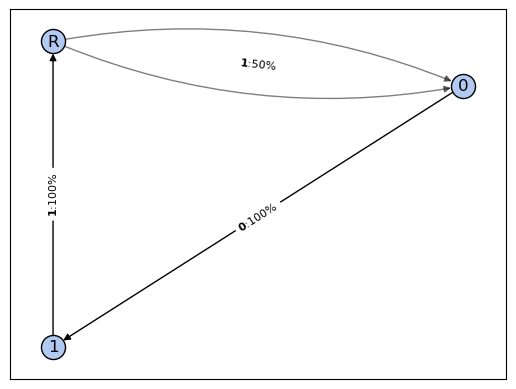

In [5]:
Z1R = ZeroOneRProcess()

# visualize the epsilon machine
graph = epsilon_machine_to_graph(Z1R.T, Z1R.state_names)
visualize_graph(
    graph, layout="spectral", draw_mixed_state=True, pdf="zero_one_r_epsilon.pdf"
)

[[0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]]
[-0.5+0.8660254j -0.5-0.8660254j  1. +0.j       ] [[ 0.28867513+0.5j  0.28867513-0.5j -0.57735027+0.j ]
 [ 0.28867513-0.5j  0.28867513+0.5j -0.57735027+0.j ]
 [-0.57735027+0.j  -0.57735027-0.j  -0.57735027+0.j ]]
[[0.33333333]
 [0.33333333]
 [0.33333333]]


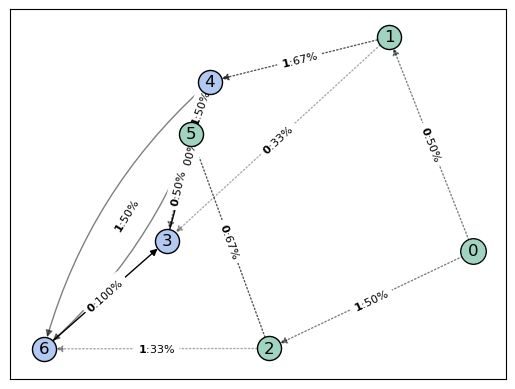

In [6]:
MSP = to_mixed_state_presentation(Z1R.T, threshold=1e-5, max_depth=5)
G_MSP = epsilon_machine_to_graph(MSP)
visualize_graph(
    G_MSP,
    layout="spring",
    draw_edge_labels=True,
    draw_mixed_state=True,
    draw_color=False,
    pdf="zero_one_r_msp.pdf",
)

Text(0.5, 1.0, '01R) Myopic Entropy')

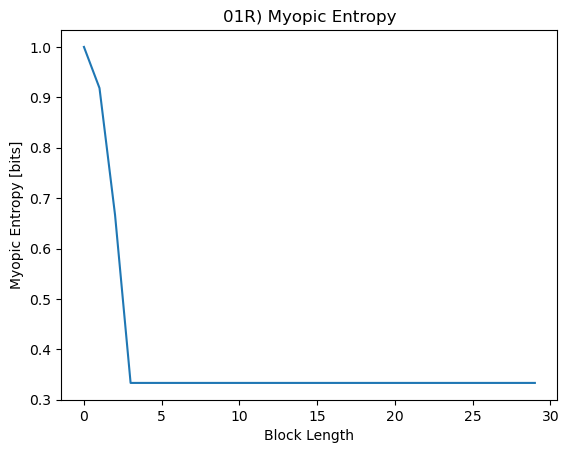

In [7]:
# myopic entropy
plt.plot(compute_myopic_entropy_from_MSP(MSP, 30))
plt.ylabel("Myopic Entropy [bits]")
plt.xlabel("Block Length")
plt.title("01R) Myopic Entropy")

In [8]:
from transformer_lens import HookedTransformer, HookedTransformerConfig

config = HookedTransformerConfig(
    d_model=16,
    d_head=4,
    n_layers=6,
    n_ctx=6,
    n_heads=4,
    d_mlp=4 * 16,
    d_vocab=2,
    act_fn="relu",
    use_attn_scale=True,
    normalization_type=None,
    attention_dir="causal",
    attn_only=False,
    seed=42,
    init_weights=True,
    device="cpu",
)

model = HookedTransformer(config)
# Define a config for the transformer and training
train_config = {
    # training config
    "batch_size": 1000,
    "sequence_length": 5000,
    "num_epochs": 100,
    "learning_rate": 1.5e-4,
    "weight_decay": 1e-5,
    "patience": 10,
    "factor": 0.5,
}

# Generate sequence data with positions
train_loader, test_loader, sequence_positions = Z1R.prepare_data(
    train_config["sequence_length"],
    model.cfg.n_ctx,
    split_ratio=0.8,
    batch_size=train_config["batch_size"],
    with_positions=True,
)

print(f"The number of batches in the training set is {len(train_loader)}")

The number of batches in the training set is 4


In [9]:
# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(
    model.parameters(),
    lr=train_config["learning_rate"],
    weight_decay=train_config["weight_decay"],
)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    patience=train_config["patience"],
    factor=train_config["factor"],
    verbose=True,
)

In [10]:
model = train_hooked_model(
    model,
    train_loader,
    test_loader,
    criterion,
    optimizer,
    scheduler,
    num_epochs=train_config["num_epochs"],
    verbose=True,
)

| Epoch | Training Acc. | Loss | Overall Acc. | Last Bit Acc. |
|   1   |    49.79%    |    2.6601     |      52.07%       |      49.05%      |
|   2   |    49.79%    |    1.1894     |      59.13%       |      57.86%      |
|   3   |    50.00%    |    0.8057     |      55.14%       |      50.95%      |
|   4   |    50.21%    |    1.0340     |      52.34%       |      50.95%      |
|   5   |    50.21%    |    0.8149     |      54.79%       |      50.95%      |
|   6   |    56.65%    |    0.6763     |      62.38%       |      59.36%      |
|   7   |    63.16%    |    0.7163     |      62.33%       |      67.57%      |
|   8   |    66.81%    |    0.6882     |      60.78%       |      66.77%      |
|   9   |    66.66%    |    0.6330     |      60.78%       |      66.77%      |
|  10   |    69.07%    |    0.6280     |      64.08%       |      75.28%      |
|  11   |    75.25%    |    0.6274     |      66.98%       |      75.28%      |
|  12   |    75.24%    |    0.6176     |      65.55%    

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# make the seaborn context prettier
sns.set_context("talk")

# define loss function as cross entropy loss, but no reduction
crossEntropy = nn.CrossEntropyLoss(reduction="none")

model.eval()
with torch.no_grad():
    # For train data
    train_loss = []
    train_accuracy = []
    for data, target in train_loader:
        if torch.cuda.is_available():
            data = data.cuda()
            target = target.cuda()
        output = model(data)
        loss = crossEntropy(output.view(-1, 2), target.view(-1))
        # Reshape loss back to original shape before saving
        train_loss.append(loss.view(data.shape[0], data.shape[1]).cpu().numpy())
        # prediction is argmax over last dimension, which is 2
        pred = output.data.max(2, keepdim=True)[1]
        correct = pred.squeeze() == data
        train_accuracy.append(correct.cpu().numpy())

    # For test data
    test_loss = []
    test_accuracy = []
    for data, target in test_loader:
        if torch.cuda.is_available():
            data = data.cuda()
            target = target.cuda()
        output = model(data)
        loss = crossEntropy(output.view(-1, 2), target.view(-1))
        test_loss.append(loss.view(data.shape[0], data.shape[1]).cpu().numpy())
        pred = output.data.max(2, keepdim=True)[1]
        correct = pred.squeeze() == data
        test_accuracy.append(correct.cpu().numpy())


train_loss = np.concatenate(train_loss)
train_accuracy = np.concatenate(train_accuracy)
test_loss = np.concatenate(test_loss)
test_accuracy = np.concatenate(test_accuracy)

print("Train Loss: ", np.mean(train_loss))
print("Train Accuracy: ", np.mean(train_accuracy))
print("Test Loss: ", np.mean(test_loss))
print("Test Accuracy: ", np.mean(test_accuracy))


# Reshape the data to long format
train_loss_df = pd.DataFrame(train_loss).melt(
    var_name="context_position", value_name="loss"
)
train_loss_df["type"] = "train"
test_loss_df = pd.DataFrame(test_loss).melt(
    var_name="context_position", value_name="loss"
)
test_loss_df["type"] = "test"

# add 1 to context pos
train_loss_df["context_position"] += 1
test_loss_df["context_position"] += 1

# convert to bits from nats
train_loss_df["loss"] = np.log2(np.exp(train_loss_df["loss"]))
test_loss_df["loss"] = np.log2(np.exp(test_loss_df["loss"]))

# Concatenate the dataframes
loss_df = pd.concat([train_loss_df, test_loss_df])

Train Loss:  0.3494073
Train Accuracy:  0.19653733833959117
Test Loss:  0.3485784
Test Accuracy:  0.20136803470136805


/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


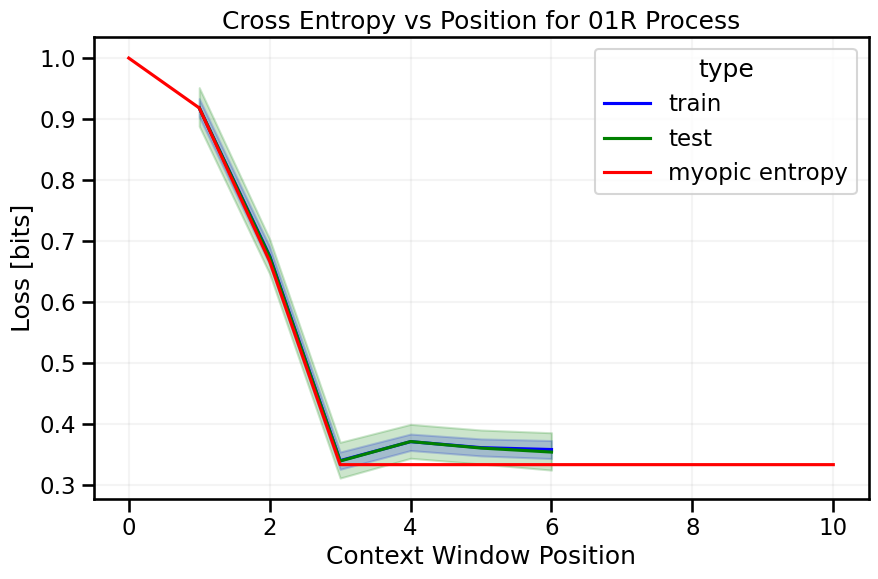

In [12]:
# Compute myopic entropy
myopic_entropy = compute_myopic_entropy_from_MSP(MSP, 11)

# Create a DataFrame for myopic entropy
myopic_entropy_df = pd.DataFrame(
    {
        "context_position": np.arange(len(myopic_entropy)),
        "loss": myopic_entropy,
        "type": "myopic entropy",
    }
)

# Concatenate the dataframes
loss_df = pd.concat([train_loss_df, test_loss_df, myopic_entropy_df])

# Define colors for each line
colors = {"train": "blue", "test": "green", "myopic entropy": "red"}

# Plot using seaborn
plt.figure(figsize=(10, 6))
plt.grid(True)  # Add a grid for better readability
# make grid lighter
plt.gca().set_axisbelow(True)
plt.grid(which="major", color="#999999", linestyle="-", alpha=0.1)
sns.lineplot(data=loss_df, x="context_position", y="loss", hue="type", palette=colors)
plt.ylabel("Loss [bits]")
plt.xlabel("Context Window Position")
plt.title("Cross Entropy vs Position for 01R Process")
plt.show()

In [13]:
probs = to_probability_distributions(Z1R.T, 7, 1e-100)
probs

[[0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]]
[-0.5+0.8660254j -0.5-0.8660254j  1. +0.j       ] [[ 0.28867513+0.5j  0.28867513-0.5j -0.57735027+0.j ]
 [ 0.28867513-0.5j  0.28867513+0.5j -0.57735027+0.j ]
 [-0.57735027+0.j  -0.57735027-0.j  -0.57735027+0.j ]]
[[0.33333333]
 [0.33333333]
 [0.33333333]]


[array([0.33333333, 0.33333333, 0.33333333]),
 array([0.33333333, 0.66666667, 0.        ]),
 array([0.33333333, 0.        , 0.66666667]),
 array([0., 1., 0.]),
 array([0., 0., 1.]),
 array([0.5, 0.5, 0. ]),
 array([1., 0., 0.])]

/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/ternary/plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


<bound method TernaryAxesSubplot.show of TernaryAxesSubplot: 700819645>

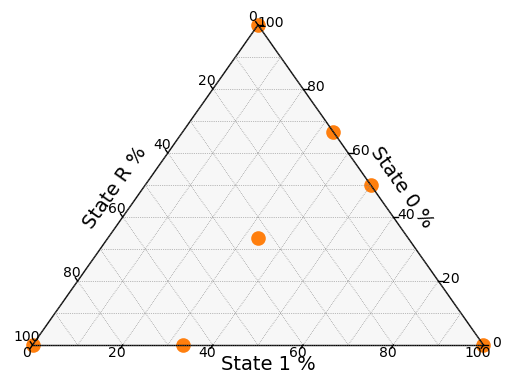

In [14]:
import pandas as pd
import plotly.express as px
import ternary

df = pd.DataFrame([100 * p for p in probs], columns=["0", "1", "R"])
fig, tax = ternary.figure(scale=100)

# Axis labels. (See below for corner labels.)
fontsize = 14
offset = 0.08
tax.left_axis_label("State R %", fontsize=fontsize, offset=offset)
tax.right_axis_label("State 0 %", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("State 1 %", fontsize=fontsize, offset=-offset)


tax.scatter(df[["0", "1", "R"]].values)
tax.boundary(linewidth=1)
tax.gridlines(multiple=10, color="gray")
tax.ticks(axis="lbr", linewidth=1, multiple=20)
tax.get_axes().axis("off")
tax.show

In [15]:
# get some training data and run it through the model
from tqdm import tqdm

datas = []
resids = []
for data, target in tqdm(train_loader):
    _, cache = model.run_with_cache(data, names_filter=lambda x: "resid_post" in x)
    datas.extend(data)
    resids.append(cache["resid_post", model.cfg.n_layers - 1])
resids = torch.concat(resids)
print(resids.shape)  # (batch, ctx_pos, res_dim)

100%|██████████| 4/4 [00:00<00:00, 64.16it/s]

torch.Size([3995, 6, 16])


torch.Size([3995, 96])


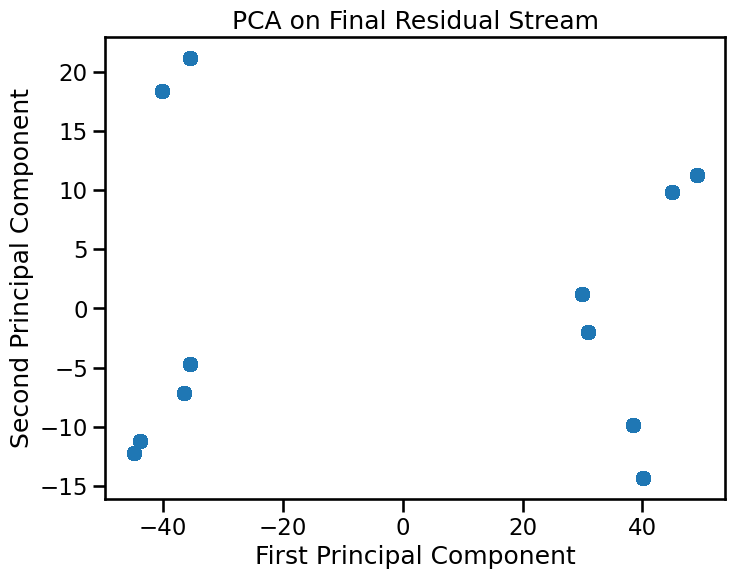

In [13]:
# reshape resids and run pca on it
from sklearn.decomposition import PCA

resids_reshaped = resids.view(resids.shape[0], -1)
print(resids_reshaped.shape)
pca = PCA(n_components=2, whiten=False)
pca_resids = pca.fit_transform(resids_reshaped)
# run the data through the pca and plot
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(pca_resids[:, 0], pca_resids[:, 1])
plt.xlabel("First Principal Component")
plt.ylabel("Second Principal Component")
plt.title("PCA on Final Residual Stream")
plt.show()

In [14]:
model.cfg.n_layers

6

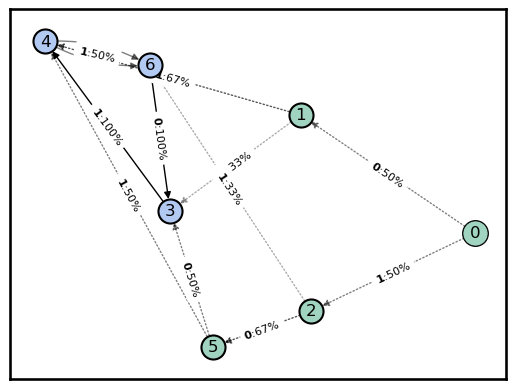

In [15]:
visualize_graph(
    G_MSP,
    layout="spring",
    draw_edge_labels=True,
    draw_mixed_state=True,
    draw_color=False,
    pdf="zero_one_r_msp.pdf",
)

In [16]:
datas[0]

tensor([0, 0, 1, 0, 0, 1])

In [16]:
MSP_states = []
for d in datas:
    this_data = []
    from_state = 0
    for p in d:
        emission = p
        transition_probs = MSP[p, from_state, :]
        # find all nonzero index
        nonzero_indices = np.nonzero(transition_probs)[0]
        # print(nonzero_indices)
        if len(nonzero_indices) != 1:
            print("warning", nonzero_indices)
        from_state = nonzero_indices[0]
        this_data.append(from_state)
    MSP_states.append(this_data)

In [17]:
MSP_states

[[1, 3, 4, 6, 3, 4],
 [2, 6, 3, 4, 6, 3],
 [1, 4, 6, 3, 4, 6],
 [2, 6, 3, 4, 6, 3],
 [1, 4, 6, 3, 4, 6],
 [1, 3, 4, 6, 3, 4],
 [1, 3, 4, 6, 3, 4],
 [1, 4, 6, 3, 4, 6],
 [2, 5, 3, 4, 6, 3],
 [1, 4, 6, 3, 4, 6],
 [1, 3, 4, 6, 3, 4],
 [1, 4, 6, 3, 4, 6],
 [1, 4, 6, 3, 4, 6],
 [1, 4, 6, 3, 4, 6],
 [2, 5, 4, 6, 3, 4],
 [2, 5, 3, 4, 6, 3],
 [1, 4, 6, 3, 4, 6],
 [2, 5, 4, 6, 3, 4],
 [1, 4, 6, 3, 4, 6],
 [1, 3, 4, 6, 3, 4],
 [1, 4, 6, 3, 4, 6],
 [2, 5, 3, 4, 6, 3],
 [1, 3, 4, 6, 3, 4],
 [1, 3, 4, 6, 3, 4],
 [1, 4, 6, 3, 4, 6],
 [1, 4, 6, 3, 4, 6],
 [2, 5, 4, 6, 3, 4],
 [1, 4, 6, 3, 4, 6],
 [2, 6, 3, 4, 6, 3],
 [1, 3, 4, 6, 3, 4],
 [1, 3, 4, 6, 3, 4],
 [2, 5, 3, 4, 6, 3],
 [2, 5, 3, 4, 6, 3],
 [2, 5, 3, 4, 6, 3],
 [1, 4, 6, 3, 4, 6],
 [1, 4, 6, 3, 4, 6],
 [1, 4, 6, 3, 4, 6],
 [2, 5, 3, 4, 6, 3],
 [1, 4, 6, 3, 4, 6],
 [1, 4, 6, 3, 4, 6],
 [1, 4, 6, 3, 4, 6],
 [1, 4, 6, 3, 4, 6],
 [1, 3, 4, 6, 3, 4],
 [2, 5, 3, 4, 6, 3],
 [1, 4, 6, 3, 4, 6],
 [2, 5, 4, 6, 3, 4],
 [1, 3, 4, 6, 3, 4],
 [1, 4, 6, 3,

torch.Size([3995, 6, 16])
torch.Size([3995, 6])
torch.Size([23970, 16])


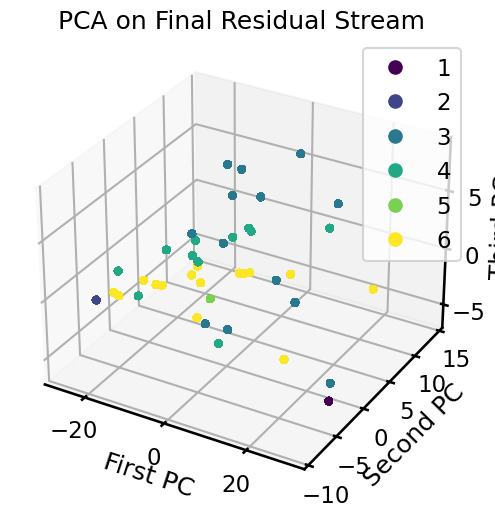

In [18]:
# reshape resids and run pca on it
from sklearn.decomposition import PCA

print(resids.shape)
resids_reshaped = resids.view(resids.shape[0] * resids.shape[1], -1)
MSP_states = torch.tensor(MSP_states)
MSP_states_reshaped = MSP_states.view(-1)
print(MSP_states.shape)
print(resids_reshaped.shape)
pca = PCA(n_components=3, whiten=False)  # Change the number of components to 3 for 3D
pca_resids = pca.fit_transform(resids_reshaped)
# run the data through the pca and plot
from mpl_toolkits.mplot3d import Axes3D  # Import 3D plotting tool

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")  # Create a 3D subplot
scatter = ax.scatter(
    pca_resids[:, 0], pca_resids[:, 1], pca_resids[:, 2], c=MSP_states_reshaped
)  # Plot in 3D
ax.set_xlabel("First PC")
ax.set_ylabel("Second PC")
ax.set_zlabel("Third PC")  # Add a label for the third dimension
ax.set_title("PCA on Final Residual Stream")
plt.legend(*scatter.legend_elements())  # Add a legend
plt.show()

In [14]:
import plotly.express as px
import pandas as pd

# reshape resids and run pca on it
from sklearn.decomposition import PCA

print(resids.shape)
resids_reshaped = resids.view(resids.shape[0] * resids.shape[1], -1)
MSP_states = torch.tensor(MSP_states)
MSP_states_reshaped = MSP_states.view(-1)
print(MSP_states.shape)
print(resids_reshaped.shape)
pca = PCA(n_components=3, whiten=False)  # Change the number of components to 3 for 3D
pca_resids = pca.fit_transform(resids_reshaped)

# Create a DataFrame for the PCA results
df = pd.DataFrame(pca_resids, columns=["First PC", "Second PC", "Third PC"])
df["MSP_states"] = MSP_states_reshaped

# Convert MSP_states to categorical type for better color handling
df["MSP_states"] = df["MSP_states"].astype("category")

# Create a 3D scatter plot using plotly
fig = px.scatter_3d(df, x="First PC", y="Second PC", z="Third PC", color="MSP_states")

# Update color scale to categorical and show legend
fig.update_traces(marker=dict(colorscale="Viridis"))
fig.show()

torch.Size([3995, 6, 16])


NameError: name 'MSP_states' is not defined

In [19]:
# get some training data and run it through the model
from tqdm import tqdm
import plotly.graph_objs as go
from IPython.display import clear_output

# Initialize an empty DataFrame for the PCA results
df = pd.DataFrame(columns=["First PC", "Second PC", "Third PC", "MSP_states", "Layer"])

for layer in range(model.cfg.n_layers):
    datas = []
    resids = []
    for data, target in tqdm(train_loader):
        _, cache = model.run_with_cache(data, names_filter=lambda x: "resid_post" in x)
        datas.extend(data)
        resids.append(cache["resid_post", layer])
    resids = torch.concat(resids)

    MSP_states = []
    for d in datas:
        this_data = []
        from_state = 0
        for p in d:
            emission = p
            transition_probs = MSP[p, from_state, :]
            nonzero_indices = np.nonzero(transition_probs)[0]
            if len(nonzero_indices) != 1:
                print("warning", nonzero_indices)
            from_state = nonzero_indices[0]
            this_data.append(from_state)
        MSP_states.append(this_data)

    # reshape resids and run pca on it
    resids_reshaped = resids.view(resids.shape[0] * resids.shape[1], -1)
    MSP_states = torch.tensor(MSP_states)
    MSP_states_reshaped = MSP_states.view(-1)

    pca = PCA(
        n_components=3, whiten=False
    )  # Change the number of components to 3 for 3D
    pca_resids = pca.fit_transform(resids_reshaped)

    # Create a DataFrame for the PCA results
    df_layer = pd.DataFrame(pca_resids, columns=["First PC", "Second PC", "Third PC"])
    df_layer["MSP_states"] = MSP_states_reshaped
    df_layer["MSP_states"] = df_layer["MSP_states"].astype("category")
    df_layer["Layer"] = layer

    df = pd.concat([df, df_layer])

# Create a 3D scatter plot using plotly
fig = px.scatter_3d(
    df,
    x="First PC",
    y="Second PC",
    z="Third PC",
    color="MSP_states",
    animation_frame="Layer",
)
fig.show()

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [00:00<00:00, 68.39it/s]
/var/folders/gv/001yhxz1531ct7td9p0zgrh80000gn/T/ipykernel_11774/1557074999.py:46: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, df_layer])
/var/folders/gv/001yhxz1531ct7td9p0zgrh80000gn/T/ipykernel_11774/1557074999.py:46: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, df_layer])
100%|██████████| 4/4 [00:00<00:00, 27.36it/s]
/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/plotly/expre

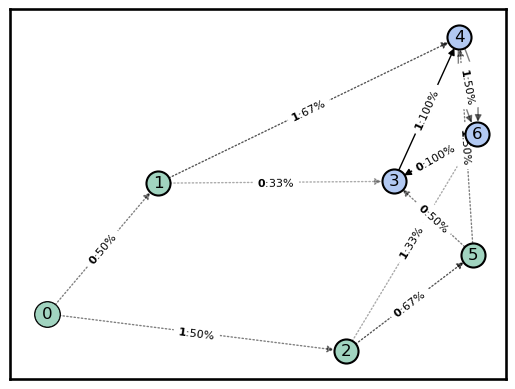

In [21]:
visualize_graph(
    G_MSP,
    layout="spring",
    draw_edge_labels=True,
    draw_mixed_state=True,
    draw_color=False,
    pdf="zero_one_r_msp.pdf",
)

In [15]:
datas_specific = [[0, 0, 1, 0, 0, 1, 1, 0, 1, 0], [1, 0, 0, 1, 1, 0, 1, 1, 0, 1]]

# get some training data and run it through the model
from tqdm import tqdm
import plotly.graph_objs as go
from IPython.display import clear_output

# Initialize an empty DataFrame for the PCA results
df = pd.DataFrame(columns=["First PC", "Second PC", "Third PC", "MSP_states", "Layer"])

for layer in range(model.cfg.n_layers):
    datas = []
    resids = []
    for data in datas_specific:
        _, cache = model.run_with_cache(
            torch.tensor(data), names_filter=lambda x: "resid_post" in x
        )
        datas.extend(data)
        resids.append(cache["resid_post", layer])
    resids = torch.concat(resids)

    MSP_states = []
    for d in datas_specific:
        this_data = []
        from_state = 0
        for p in d:
            emission = p
            transition_probs = MSP[p, from_state, :]
            nonzero_indices = np.nonzero(transition_probs)[0]
            if len(nonzero_indices) != 1:
                print("warning", nonzero_indices)
            from_state = nonzero_indices[0]
            this_data.append(from_state)
        MSP_states.append(this_data)

    # reshape resids and run pca on it
    resids_reshaped = resids.view(resids.shape[0] * resids.shape[1], -1)
    MSP_states = torch.tensor(MSP_states)
    MSP_states_reshaped = MSP_states.view(-1)

    pca = PCA(
        n_components=3, whiten=False
    )  # Change the number of components to 3 for 3D
    pca_resids = pca.fit_transform(resids_reshaped)

    # Create a DataFrame for the PCA results
    df_layer = pd.DataFrame(pca_resids, columns=["First PC", "Second PC", "Third PC"])
    df_layer["MSP_states"] = MSP_states_reshaped
    df_layer["MSP_states"] = df_layer["MSP_states"].astype("category")
    df_layer["Layer"] = layer

    df = pd.concat([df, df_layer])

# Create a 3D scatter plot using plotly
fig = px.scatter_3d(
    df,
    x="First PC",
    y="Second PC",
    z="Third PC",
    color="MSP_states",
    animation_frame="Layer",
)
fig.show()

RuntimeError: The size of tensor a (10) must match the size of tensor b (6) at non-singleton dimension 1

In [338]:
dict(zip(range(len(probs)), probs))

{0: array([0.33333333, 0.33333333, 0.33333333]),
 1: array([0.33333333, 0.66666667, 0.        ]),
 2: array([0.33333333, 0.        , 0.66666667]),
 3: array([0., 1., 0.]),
 4: array([0., 0., 1.]),
 5: array([0.5, 0.5, 0. ]),
 6: array([1., 0., 0.])}

In [20]:
import torch
import torch.nn as nn
import torch.nn.utils.parametrizations as parametrizations


class PlaneProjectionModel(nn.Module):
    def __init__(self, input_dim=16, output_dim=2):
        super(PlaneProjectionModel, self).__init__()
        self.linear = nn.Linear(input_dim, output_dim, bias=False)

        # initialize
        nn.init.xavier_uniform_(self.linear.weight)

    def forward(self, x):
        # Project the input to 2D with an offset in the 16D space
        return self.linear(x)


import plotly.express as px
import pandas as pd

# reshape resids and run pca on it
print(resids.shape)
resids_reshaped = resids.view(resids.shape[0] * resids.shape[1], -1)
MSP_states = torch.tensor(MSP_states)
MSP_states_reshaped = MSP_states.view(-1)
print(MSP_states_reshaped.shape)
print(resids_reshaped.shape)

torch.Size([3995, 6, 16])
torch.Size([23970])
torch.Size([23970, 16])


/var/folders/gv/001yhxz1531ct7td9p0zgrh80000gn/T/ipykernel_11774/3953996076.py:24: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [1]:
probs = [torch.tensor(p) for p in probs]
state_prob_dict = dict(zip(range(len(probs)), probs))

from torch.utils.data import Dataset, DataLoader


class PairwiseDataset(Dataset):
    def __init__(self, vectors, labels):
        self.vectors = vectors
        self.labels = labels

        # Create all possible pairs of indices
        self.pairs = [
            (i, j) for i in range(len(vectors)) for j in range(i + 1, len(vectors))
        ]

    def __getitem__(self, index):
        i, j = self.pairs[index]
        vector1 = self.vectors[i]
        vector2 = self.vectors[j]
        label1 = self.labels[i].item()  # Convert to Python integer
        label2 = self.labels[j].item()  # Convert to Python integer

        # Calculate the distance between the probabilities of the two vectors' states
        distance = torch.dist(state_prob_dict[label1], state_prob_dict[label2])

        return vector1, vector2, distance

    def __len__(self):
        return len(self.pairs)


pairwise_dataset = PairwiseDataset(resids_reshaped, MSP_states_reshaped)
pairwise_loader = DataLoader(
    pairwise_dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True
)

NameError: name 'probs' is not defined

In [31]:
v1, v2, d = next(iter(pairwise_loader))

In [32]:
total_examples = len(pairwise_dataset)
print(f"Total examples in the dataloader: {total_examples}")

Total examples in the dataloader: 287268465


In [33]:
def contrastive_loss(output1, output2, distance):
    return torch.abs(torch.dist(output1, output2) - distance).mean()


model = PlaneProjectionModel()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

num_epochs = 100
for epoch in tqdm(range(num_epochs)):
    for i, (vector1, vector2, distance) in enumerate(pairwise_loader):
        if i >= 100:
            break
        optimizer.zero_grad()
        output1 = model(vector1)
        output2 = model(vector2)
        loss = contrastive_loss(output1, output2, distance)
        loss.backward()
        optimizer.step()
    scheduler.step()

    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item()}")

  1%|          | 1/100 [00:09<16:00,  9.70s/it]

Epoch [1/100], Loss: 65.58167500465106


  2%|▏         | 2/100 [00:19<15:55,  9.75s/it]

Epoch [2/100], Loss: 59.70141499231411


  3%|▎         | 3/100 [00:30<16:51, 10.42s/it]

Epoch [3/100], Loss: 60.01389922027221


  4%|▍         | 4/100 [00:41<16:44, 10.46s/it]

Epoch [4/100], Loss: 61.24403258369452


  5%|▌         | 5/100 [00:51<16:15, 10.27s/it]

Epoch [5/100], Loss: 50.26454573790951


  5%|▌         | 5/100 [00:58<18:31, 11.70s/it]


KeyboardInterrupt: 

tensor([[-0.3832, -0.0933, -0.3472,  0.0246,  0.0991,  0.0935, -0.3316, -0.2878,
         -0.2349, -0.0623,  0.0255, -0.3196,  0.0336, -0.0136,  0.4133, -0.4218],
        [ 0.1236,  0.1016, -0.0250, -0.3353,  0.3096, -0.0701, -0.4957, -0.0365,
         -0.0458,  0.2468, -0.2724, -0.1223, -0.4685, -0.2492, -0.2524,  0.1267]],
       grad_fn=<TransposeBackward0>)


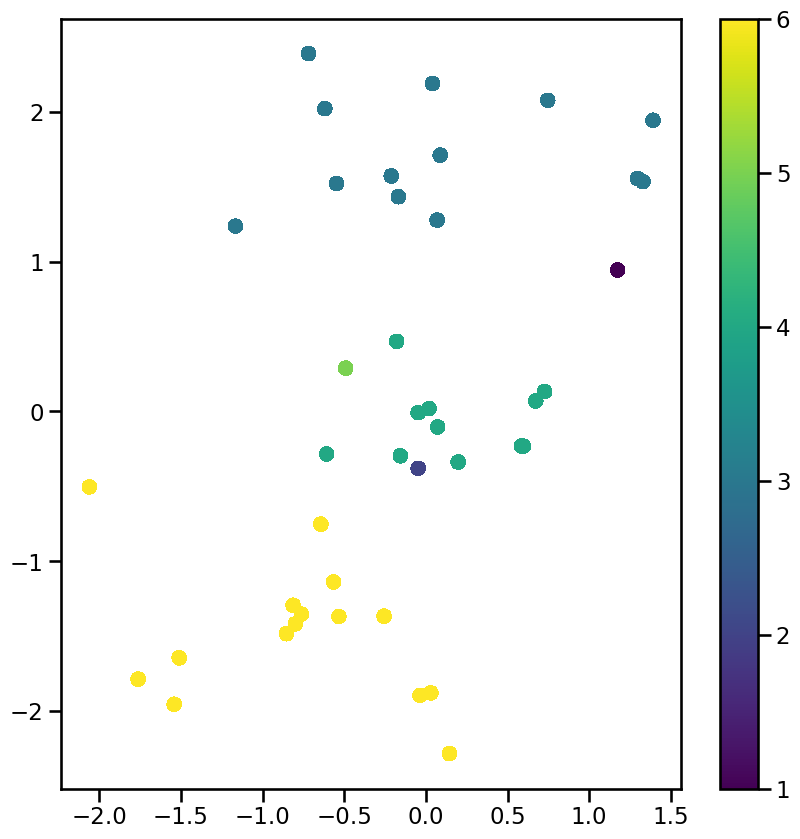

In [335]:
print(model.linear.weight)

transformed_vectors = model(same_class_dataset.vectors)
transformed_vectors = transformed_vectors.detach().numpy()

plt.figure(figsize=(10, 10))
plt.scatter(
    transformed_vectors[:, 0], transformed_vectors[:, 1], c=same_class_dataset.labels
)
plt.colorbar()
plt.show()

tensor([[-0.3832, -0.0933, -0.3472,  0.0246,  0.0991,  0.0935, -0.3316, -0.2878,
         -0.2349, -0.0623,  0.0255, -0.3196,  0.0336, -0.0136,  0.4133, -0.4218],
        [ 0.1236,  0.1016, -0.0250, -0.3353,  0.3096, -0.0701, -0.4957, -0.0365,
         -0.0458,  0.2468, -0.2724, -0.1223, -0.4685, -0.2492, -0.2524,  0.1267]],
       grad_fn=<TransposeBackward0>)


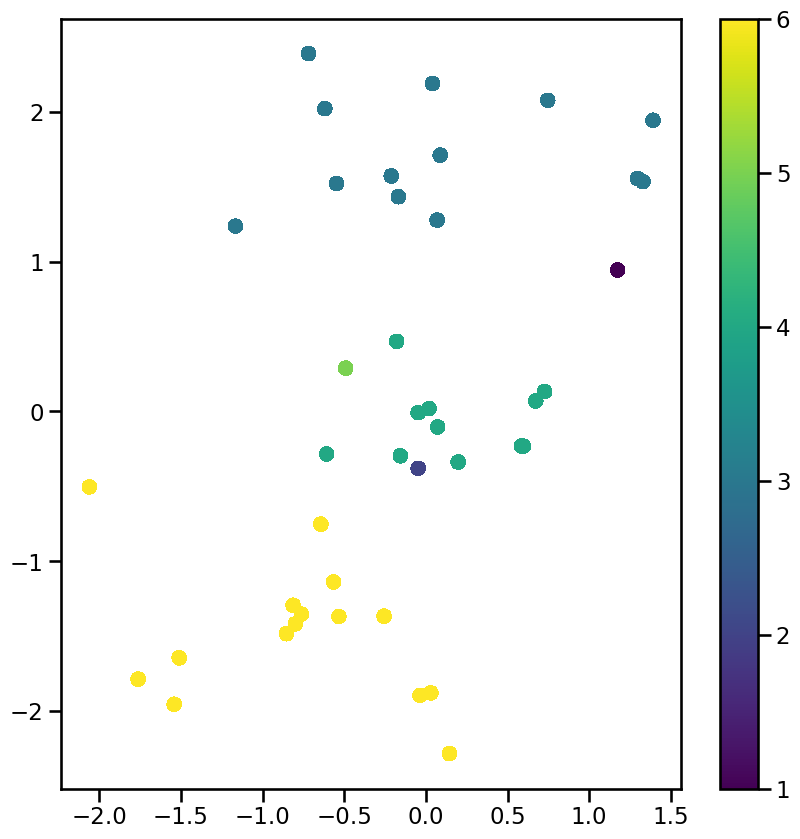

In [336]:
print(model.linear.weight)

transformed_vectors = model(same_class_dataset.vectors)
transformed_vectors = transformed_vectors.detach().numpy()

plt.figure(figsize=(10, 10))
plt.scatter(
    transformed_vectors[:, 0], transformed_vectors[:, 1], c=same_class_dataset.labels
)
plt.colorbar()
plt.show()

In [3]:
state_prob_dict = dict(zip(range(len(probs)), probs))
print(resids_reshaped.shape, MSP_states_reshaped.shape)

NameError: name 'probs' is not defined

In [ ]:
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import LinearRegression

# Initialize MultiOutputRegressor with a LinearRegression model
model = MultiOutputRegressor(LinearRegression())

# Fit the model to your data
model.fit(vectors, target_distributions)

# Predict the distributions for new data
predicted_distributions = model.predict(new_vectors)